In [1]:
library(dyno)
library(dyngen)
library(parallel)
library(tidyverse)
library(SingleCellExperiment)

Loading required package: dynfeature

Loading required package: dynguidelines

Loading required package: dynmethods

Loading required package: dynplot

Loading required package: dynwrap

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

✔ ggplot2 3.3.3     ✔ purrr   0.3.4
✔ tibble  3.1.0     ✔ dplyr   1.0.5
✔ tidyr   1.1.3     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colC

## Step 1: Define Backbone and Other Parameters

A Dyngen simulation is started by defining a backbone. Dyngen provides you with an initial set of backbone options that you can use. The backbone of a dyngen model is what determines the overall dynamic process that a cell will undergo during a simulation. It consists of a set of gene modules, which regulate each other in such a way that expression of certain genes change over time in a specific manner.

In [2]:
set.seed(1)
backbone = backbone_disconnected()
options(repr.plot.width=15, repr.plot.height=15)

config = initialise_model(
            backbone = backbone,
            num_cells = 10000,
            num_tfs = 100,
            num_targets = 1000,
            num_hks = 200,
            verbose = FALSE
          )

config$num_cores = 5

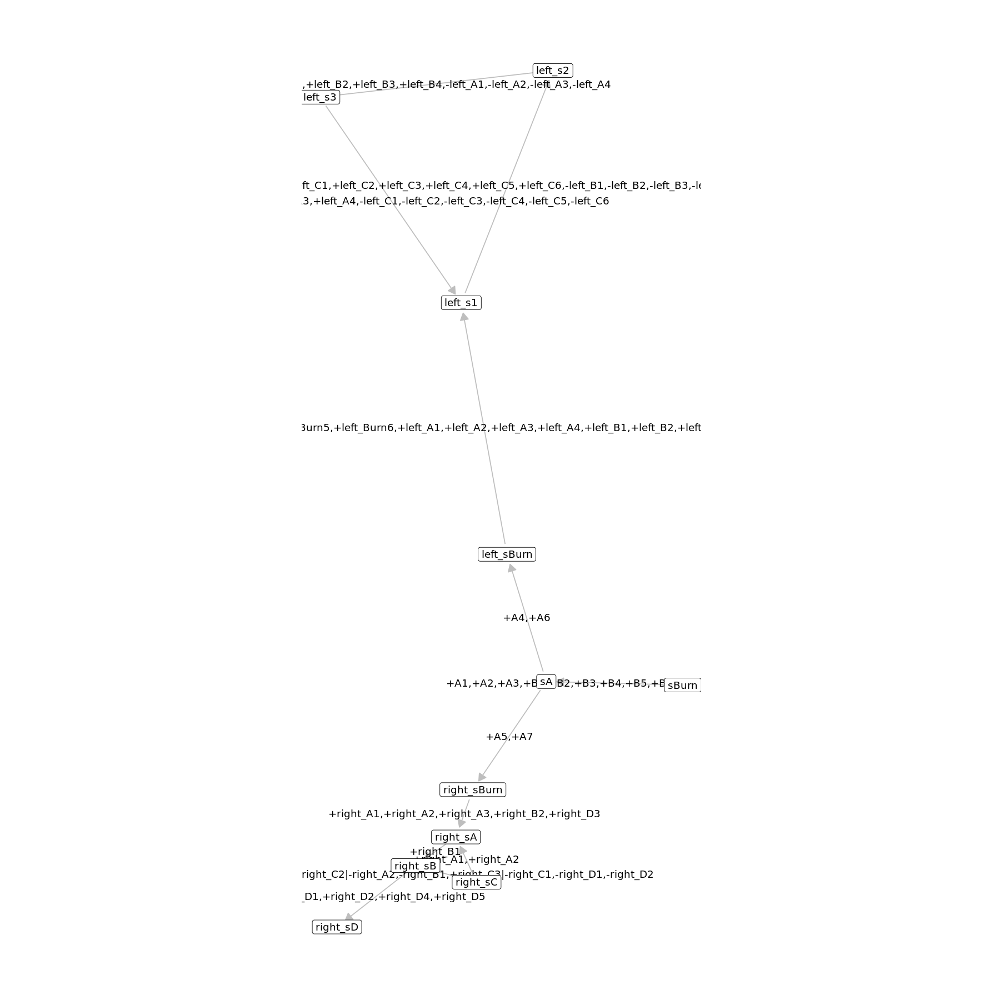

In [3]:
plot_backbone_statenet(config)

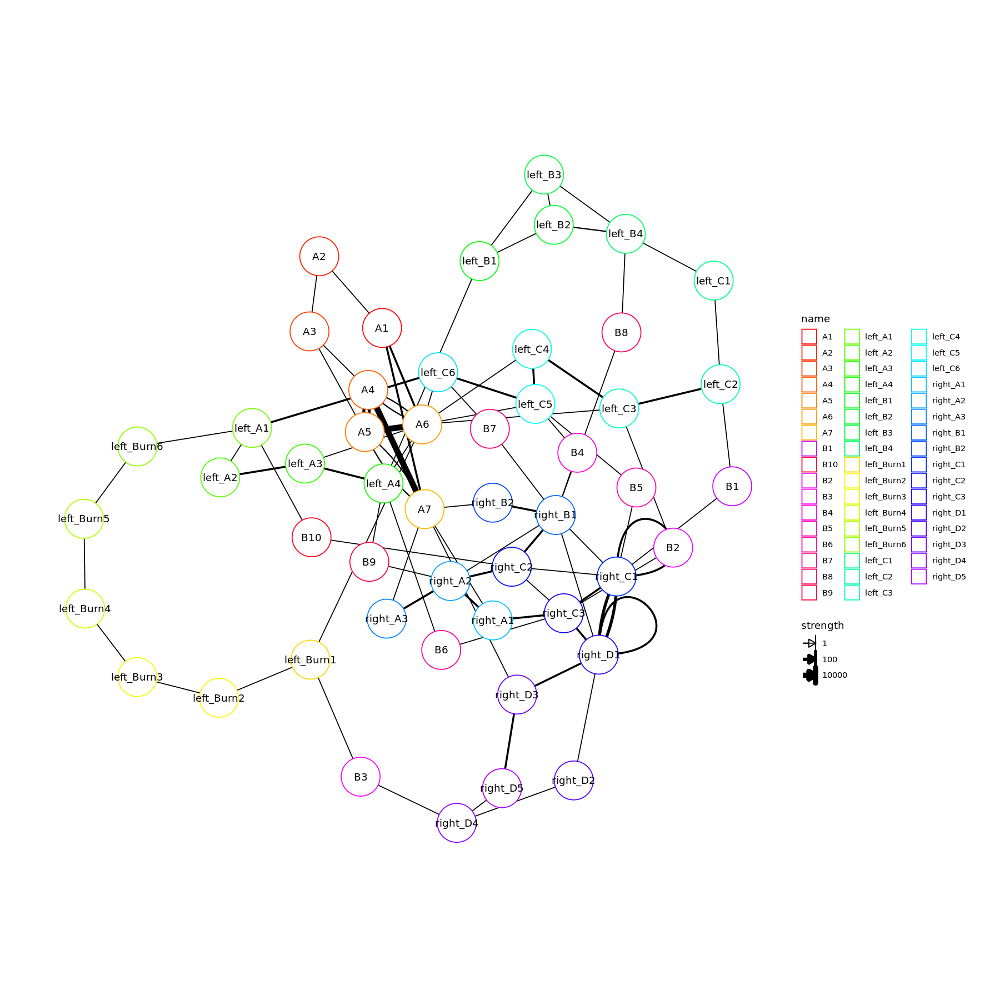

In [4]:
plot_backbone_modulenet(config)

## Step 2: Generate Transcription Factors (TFs)

Each Gene Module consists of a set of transcription factors. These can be generated and visualized as follows.

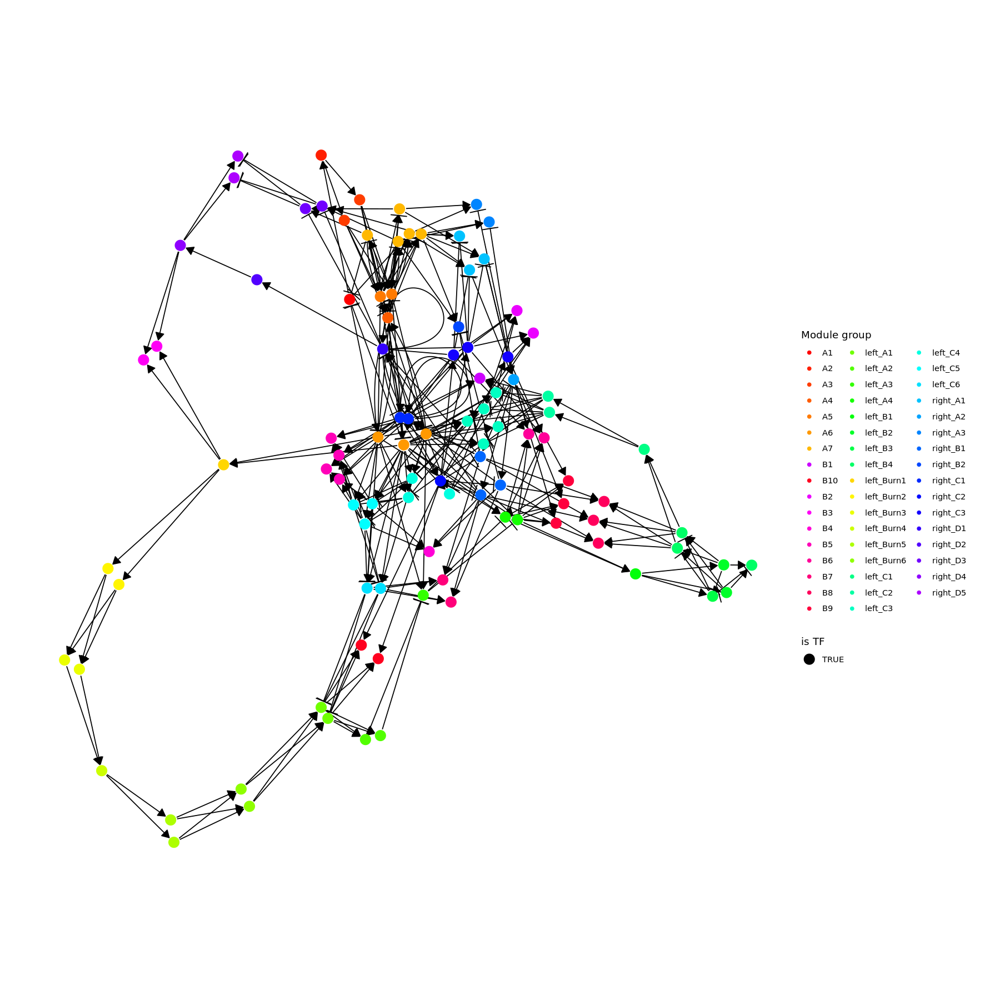

In [5]:
model = generate_tf_network(config)
plot_feature_network(model, show_targets = FALSE)

## Step 3: Sample Target Genes and Housekeeping genes (HKs)

Next, target genes and housekeeping genes are added to the network by sampling a gold standard gene regulatory network using the Page Rank algorithm. Target genes are regulated by TFs or other target genes, while HKs are only regualted by themselves.

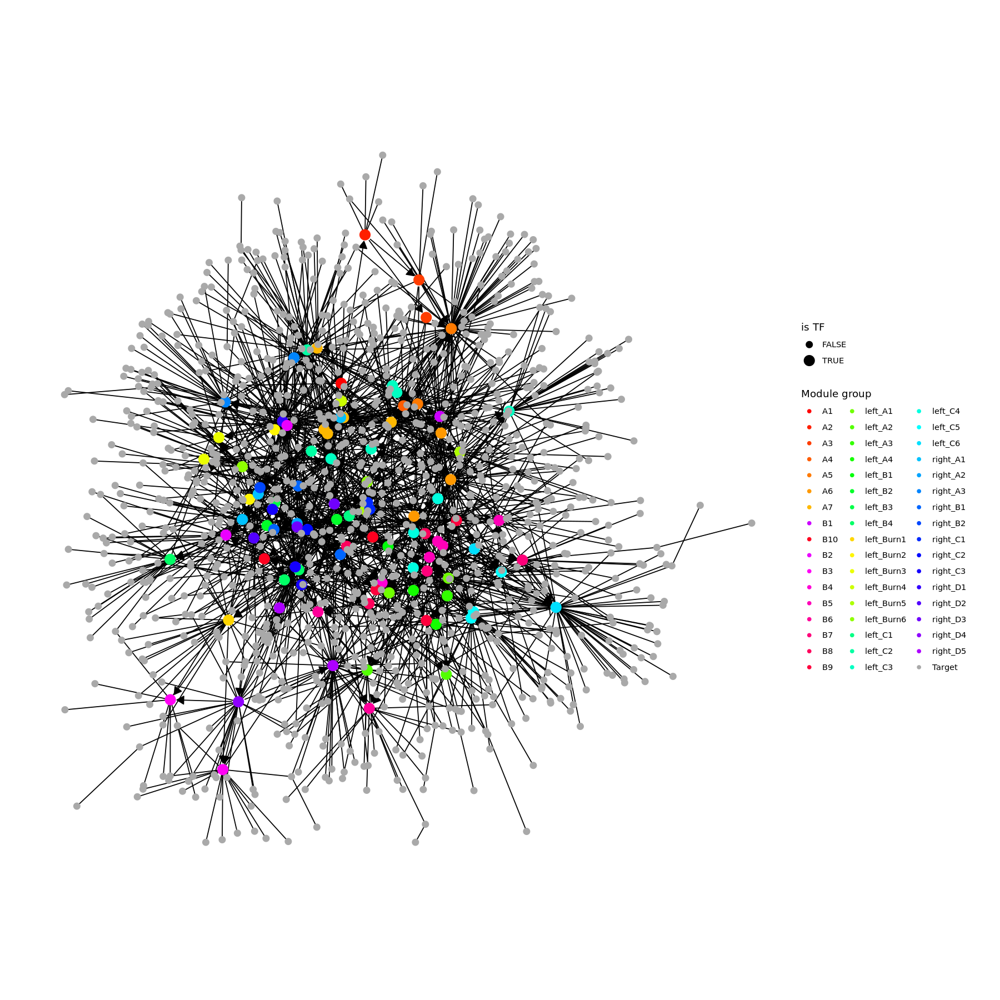

In [6]:
model = generate_feature_network(model)
plot_feature_network(model)

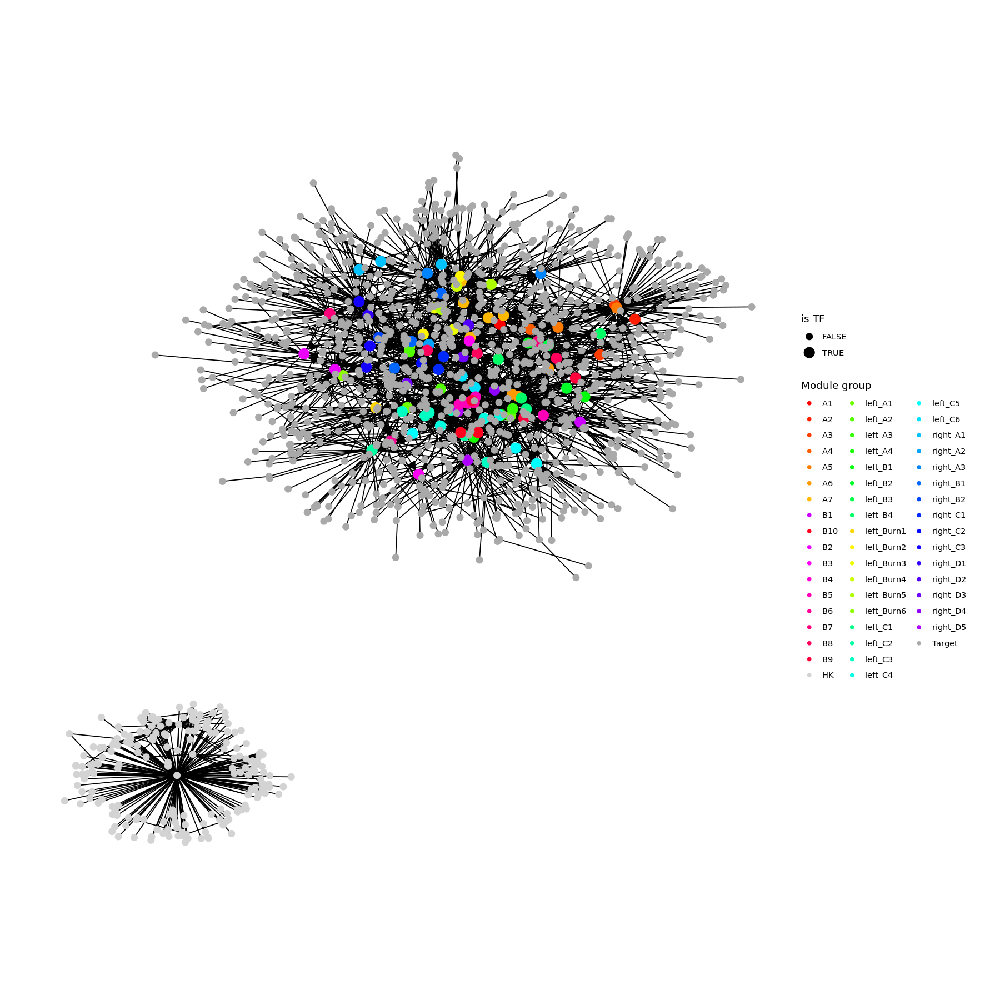

In [7]:
plot_feature_network(model, show_hks = TRUE)

## Step 4: Generate Kinetics

Note that the target network does not show the effect of some interactions, because these are generated along with other kinetics parameters of the SSA Simulation.

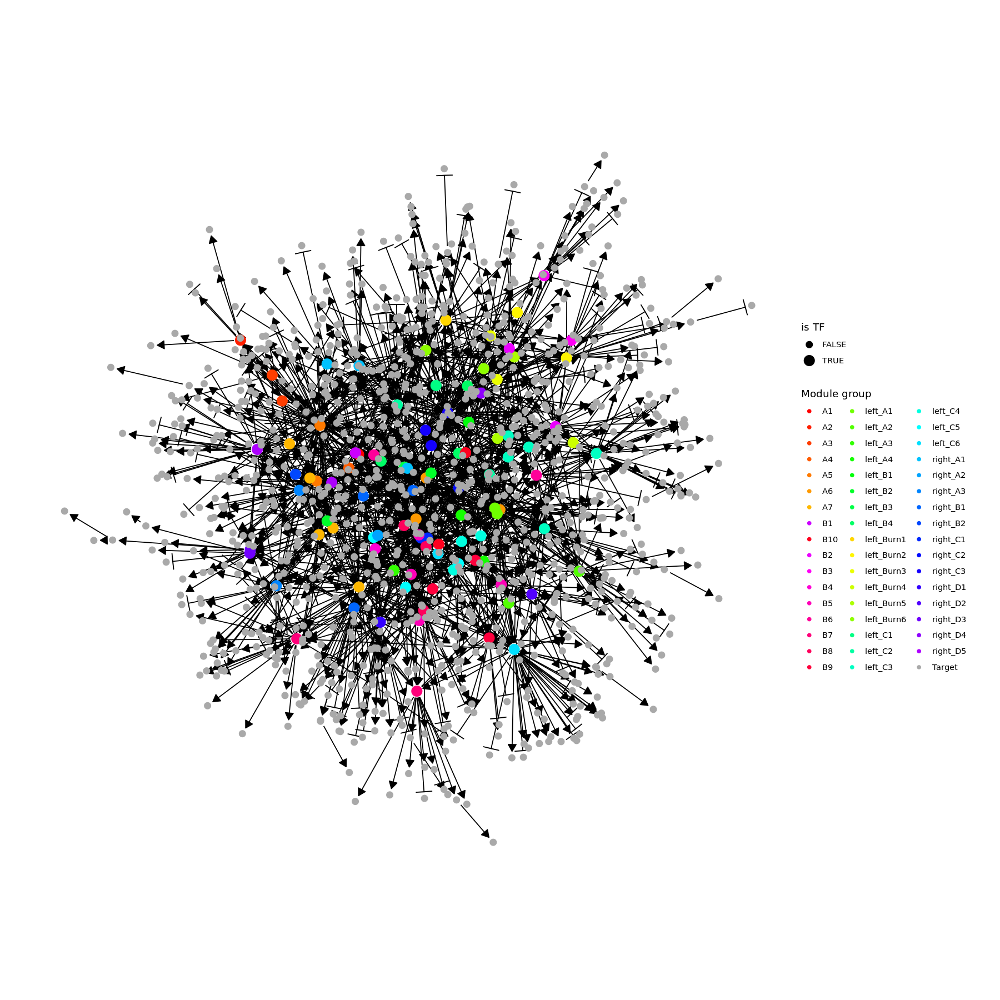

In [8]:
model = generate_kinetics(model)
plot_feature_network(model)

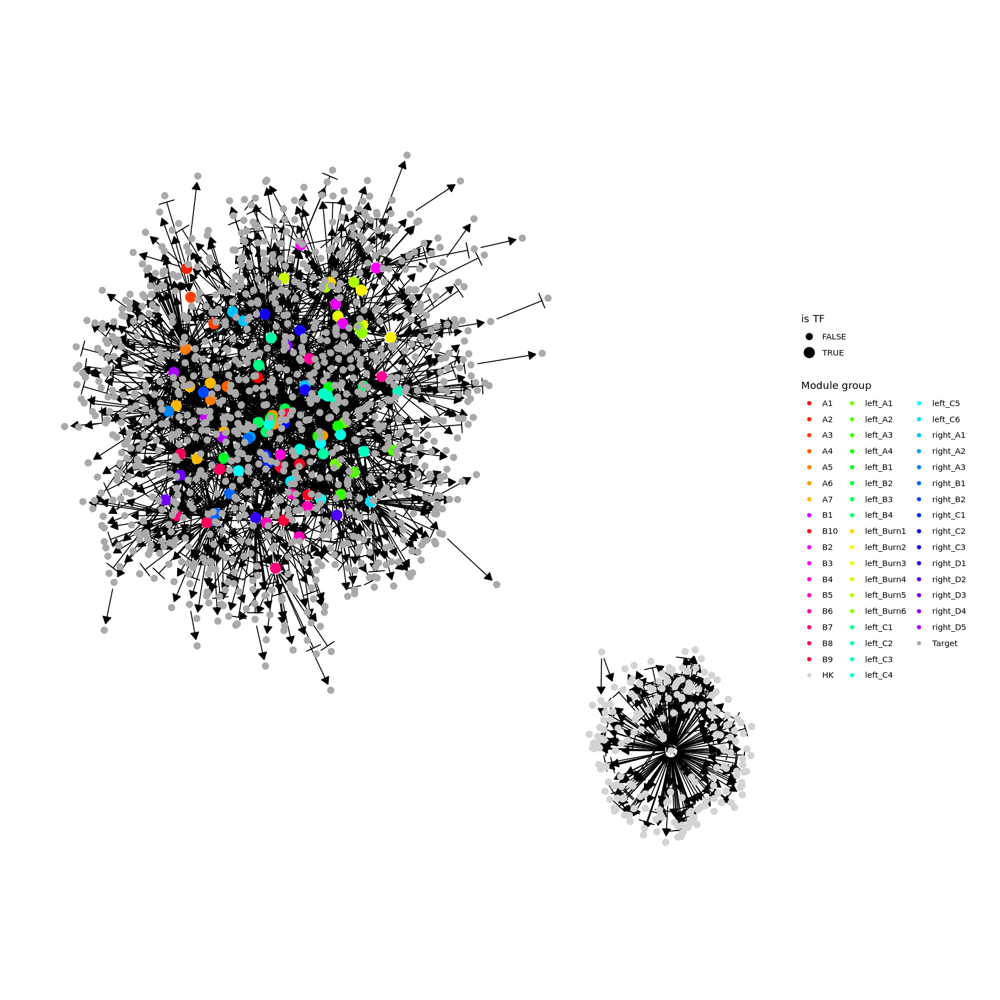

In [9]:
plot_feature_network(model, show_hks=TRUE)

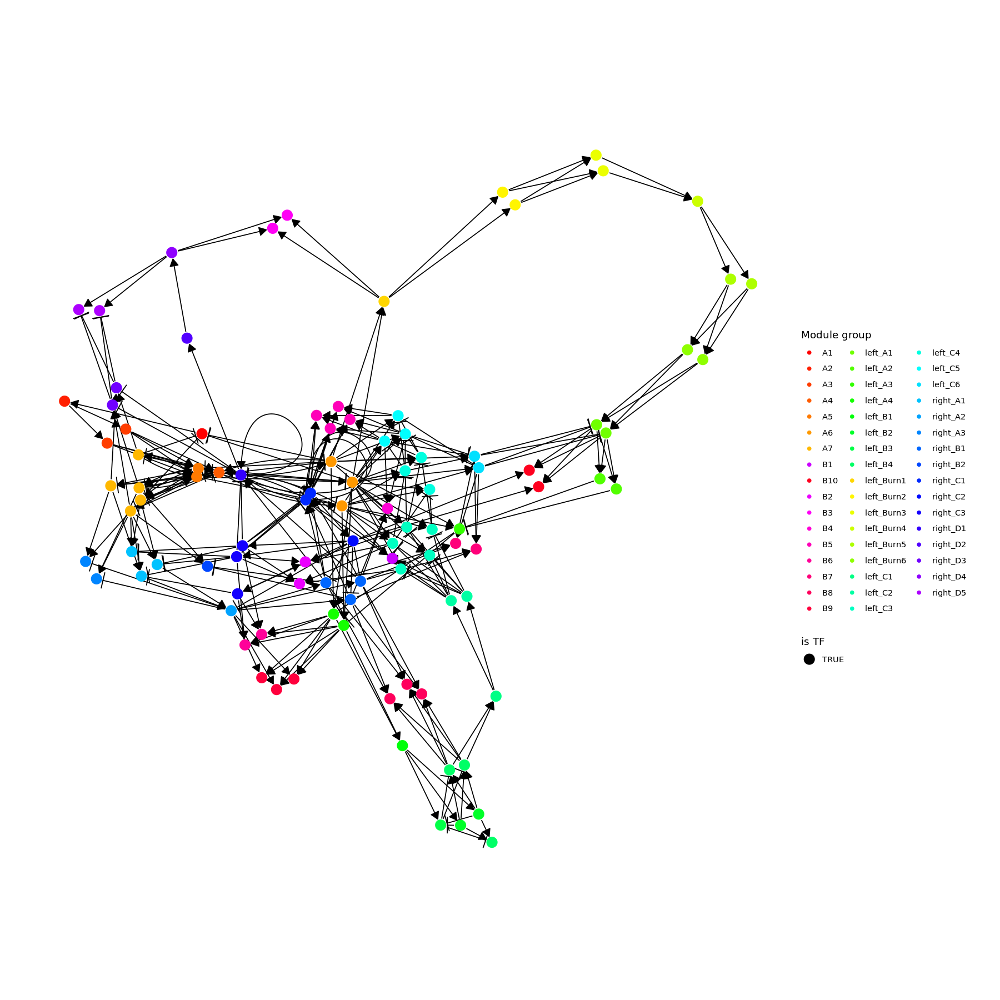

In [10]:
plot_feature_network(model, show_targets=FALSE)

In [11]:
names(model)

[1] "backbone"               "numbers"                "distance_metric"       
 [4] "tf_network_params"      "feature_network_params" "kinetics_params"       
 [7] "gold_standard_params"   "simulation_params"      "experiment_params"     
[10] "verbose"                "download_cache_dir"     "num_cores"             
[13] "id"                     "timings"                "feature_info"          
[16] "feature_network"        "simulation_system"

In [12]:
model$feature_network

from,to,from_module,to_module,effect,strength,hill,max_protein,dissociation
<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
A6_TF1,A1_TF1,A6,A1,-1,1e+01,2,27374.54,13687.27
A6_TF3,A1_TF1,A6,A1,-1,1e+01,2,80762.61,40381.30
A7_TF1,A1_TF1,A7,A1,-1,1e+01,2,29392.36,14696.18
A7_TF3,A1_TF1,A7,A1,-1,1e+01,2,90439.33,45219.67
A1_TF1,A2_TF1,A1,A2,1,1e+00,2,119283.20,59641.60
A2_TF1,A3_TF1,A2,A3,1,1e+00,2,63752.31,31876.16
A2_TF1,A3_TF2,A2,A3,1,1e+00,2,63752.31,31876.16
A3_TF1,A4_TF1,A3,A4,1,1e+00,2,59705.10,29852.55
A3_TF2,A4_TF1,A3,A4,1,1e+00,2,66707.09,33353.55


## Step 5: Simulate Gold Standard

In [13]:
model = generate_gold_standard(model)

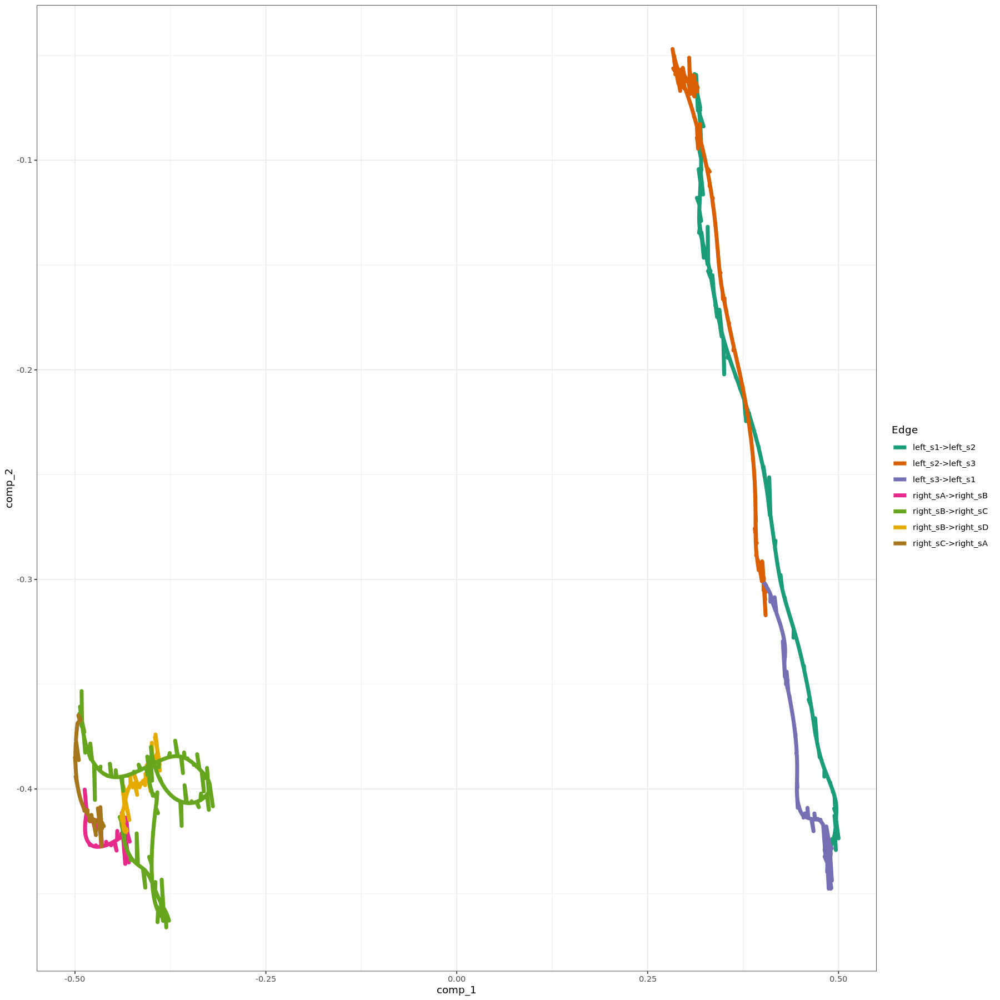

In [14]:
plot_gold_simulations(model) + scale_colour_brewer(palette = "Dark2")

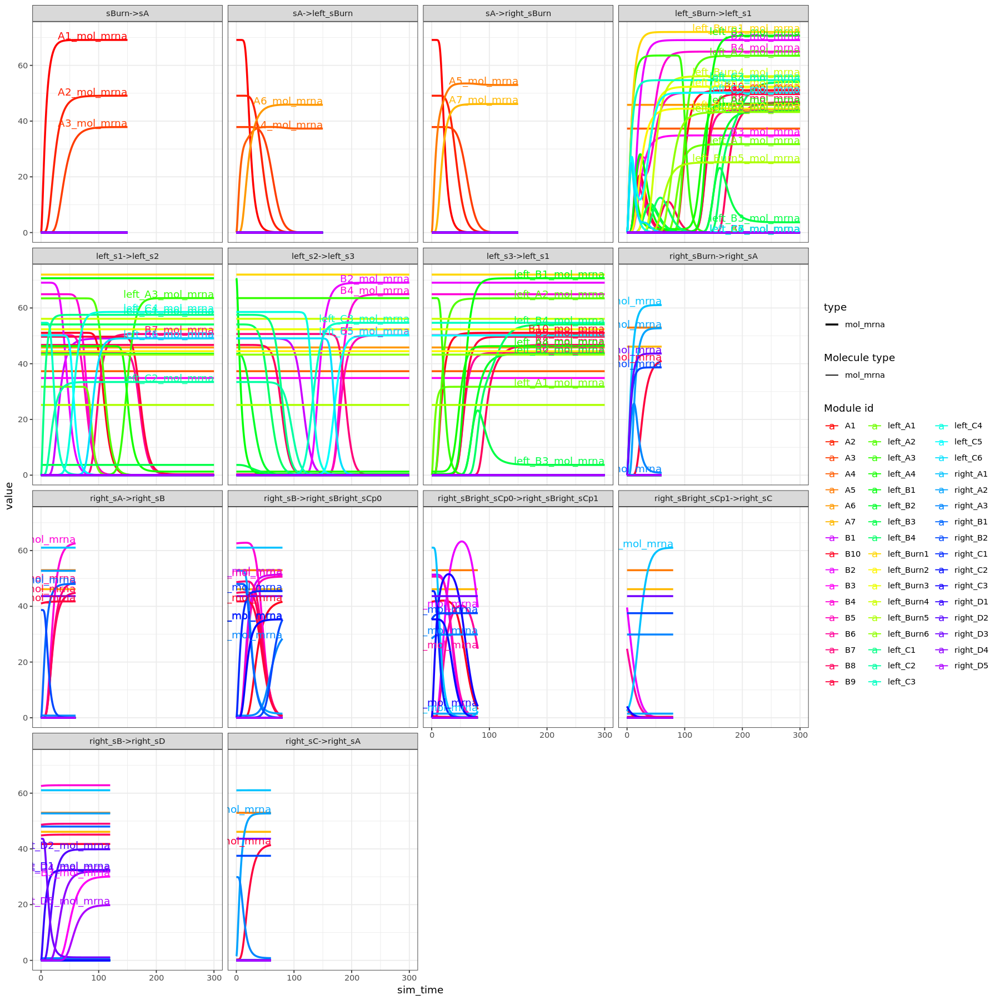

In [15]:
plot_gold_expression(model, what = "mol_mrna") # mrna

## Step 6: Simulate Cells

Cells are simualted by running SSA simulations. The Simulations are again using dimensionality reduction.

Warning message in .generate_cells_predict_state(model):
“Simulation does not contain all gold standard edges. This simulation likely suffers from bad kinetics; choose a different seed and rerun.”


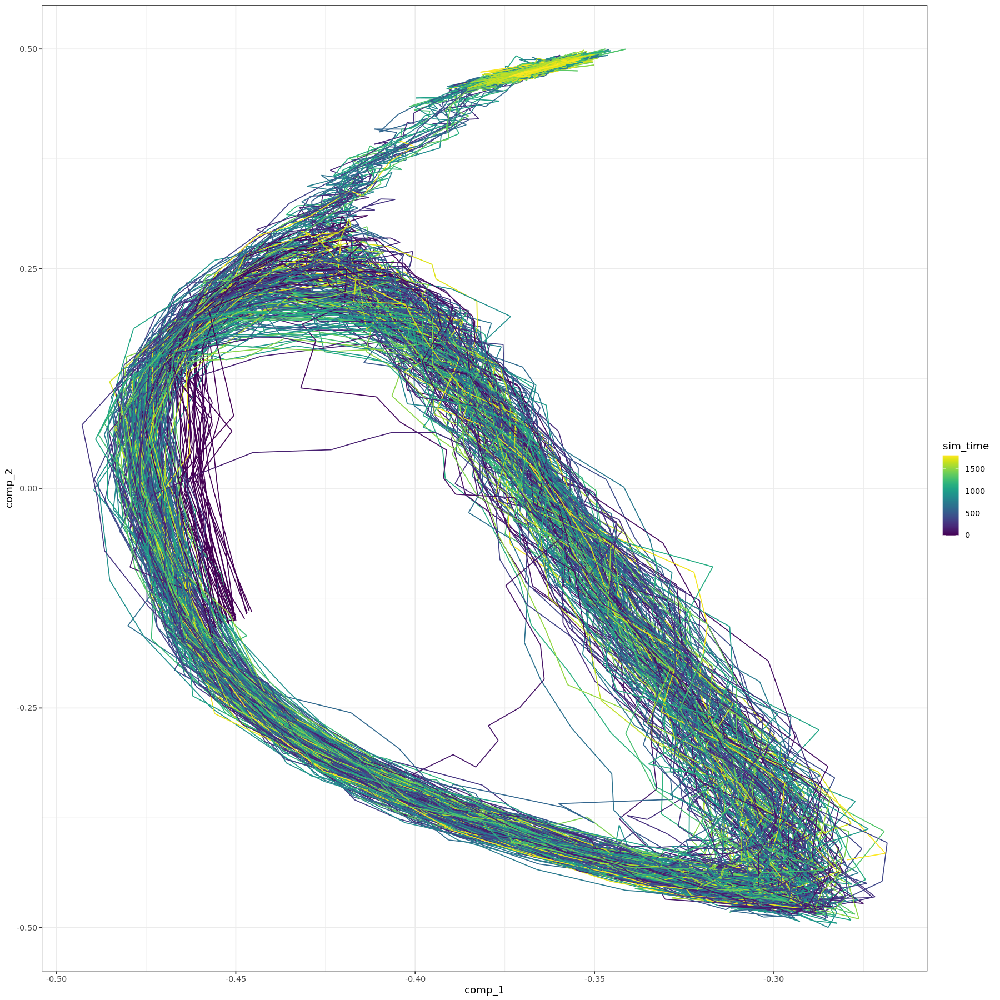

In [16]:
model = generate_cells(model)
plot_simulations(model)

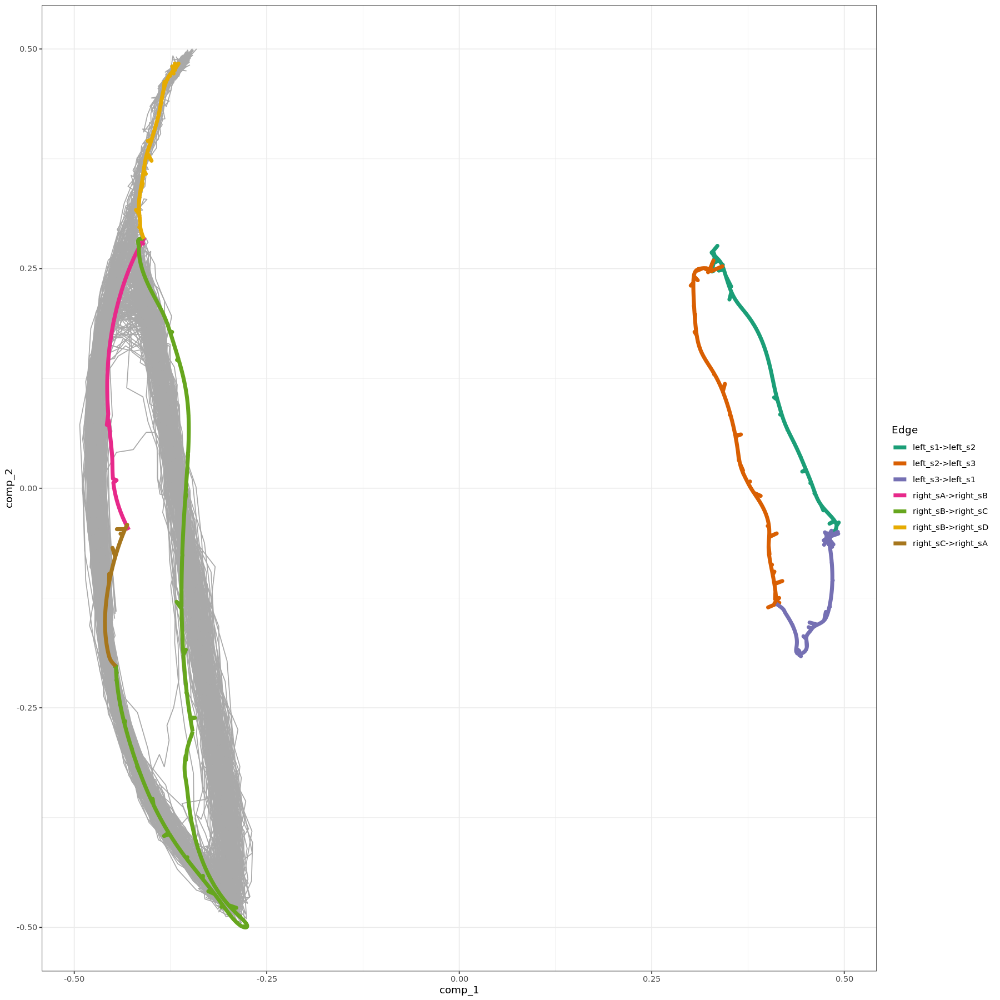

In [17]:
plot_gold_simulations(model) + scale_colour_brewer(palette = "Dark2")

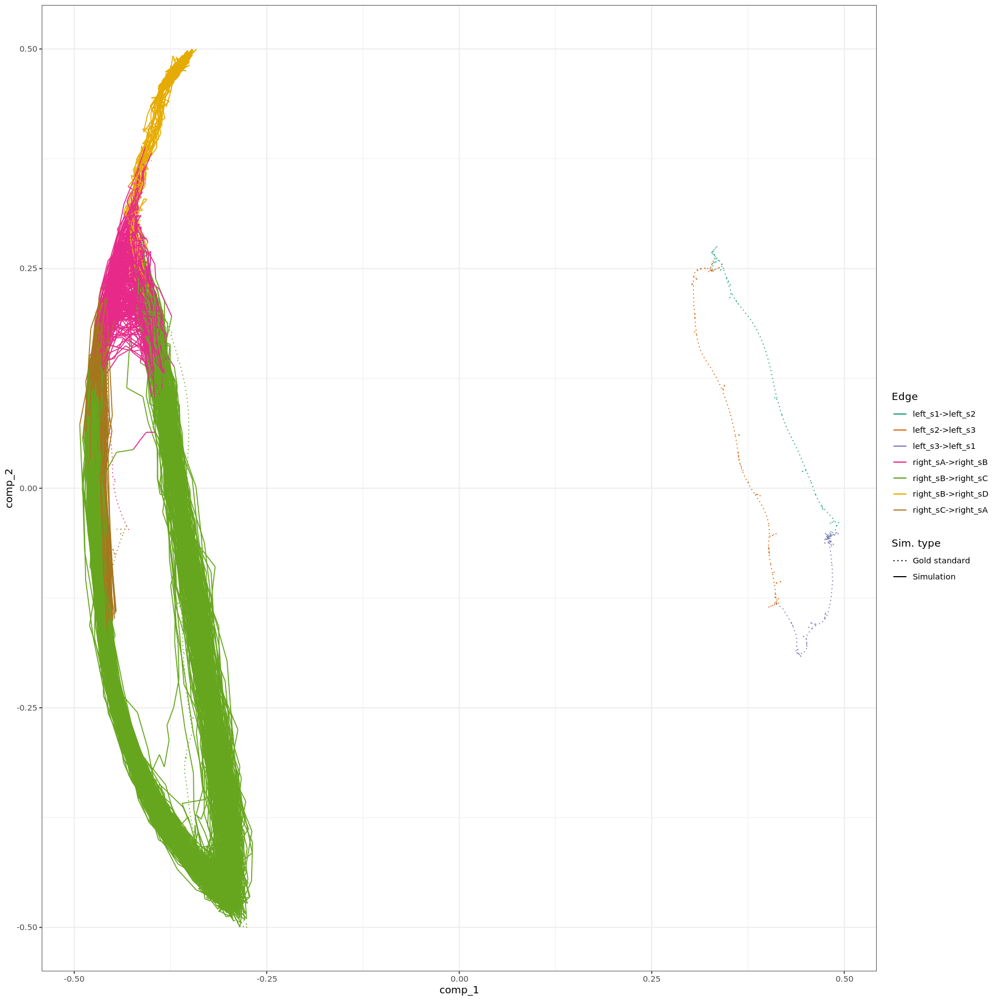

In [18]:
plot_gold_mappings(model, do_facet = FALSE) + scale_colour_brewer(palette = "Dark2")

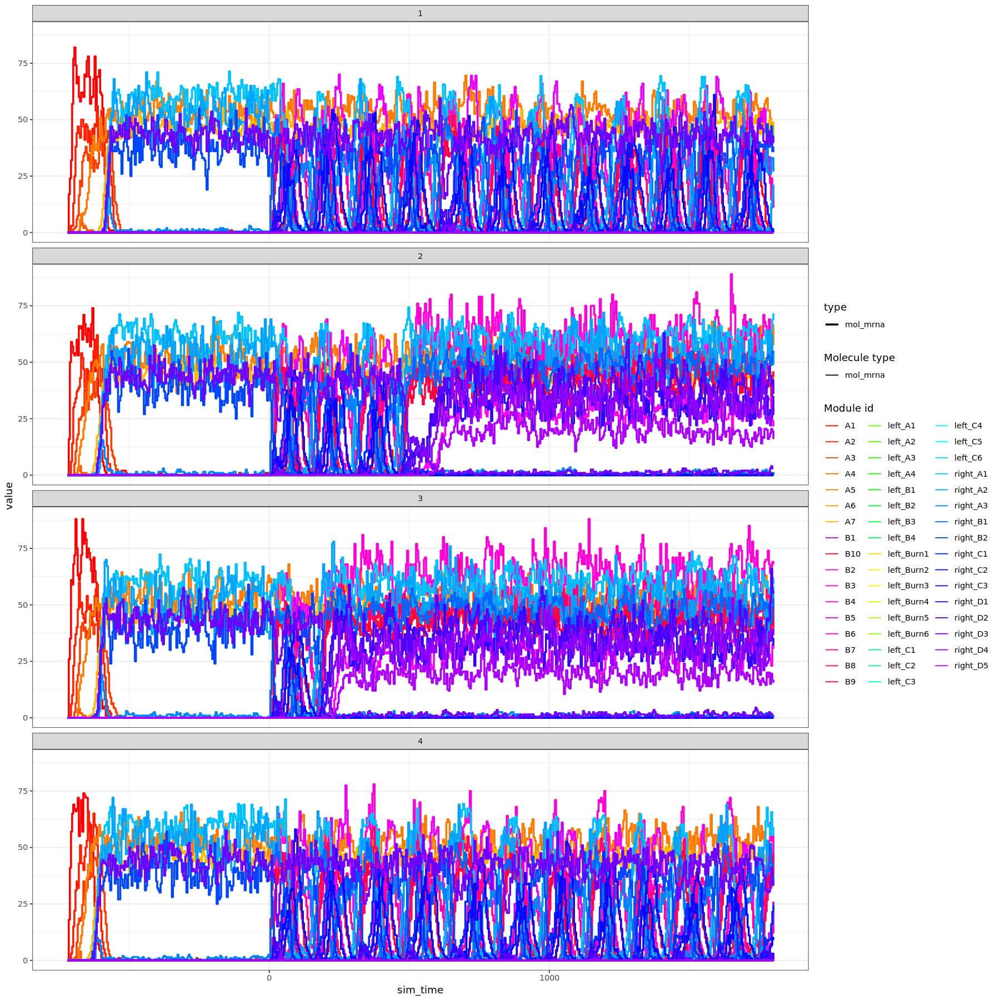

In [19]:
plot_simulation_expression(model, 1:4, what = "mol_mrna")

## Step 7: Experiment Emulation

Effects from performing a single-cell RNA-Seq experiment can be emulated as follows.

In [22]:
model = generate_experiment(model)

## Step 8: Convert to a Dyno Object

Converting the dyngen to a dyno object allows you to visualize the dataset using the **dynplot** functions, or infer trajectories using **dynmethods**.

In [23]:
dataset = as_dyno(model)

Coloring by milestone

Using milestone_percentages from trajectory



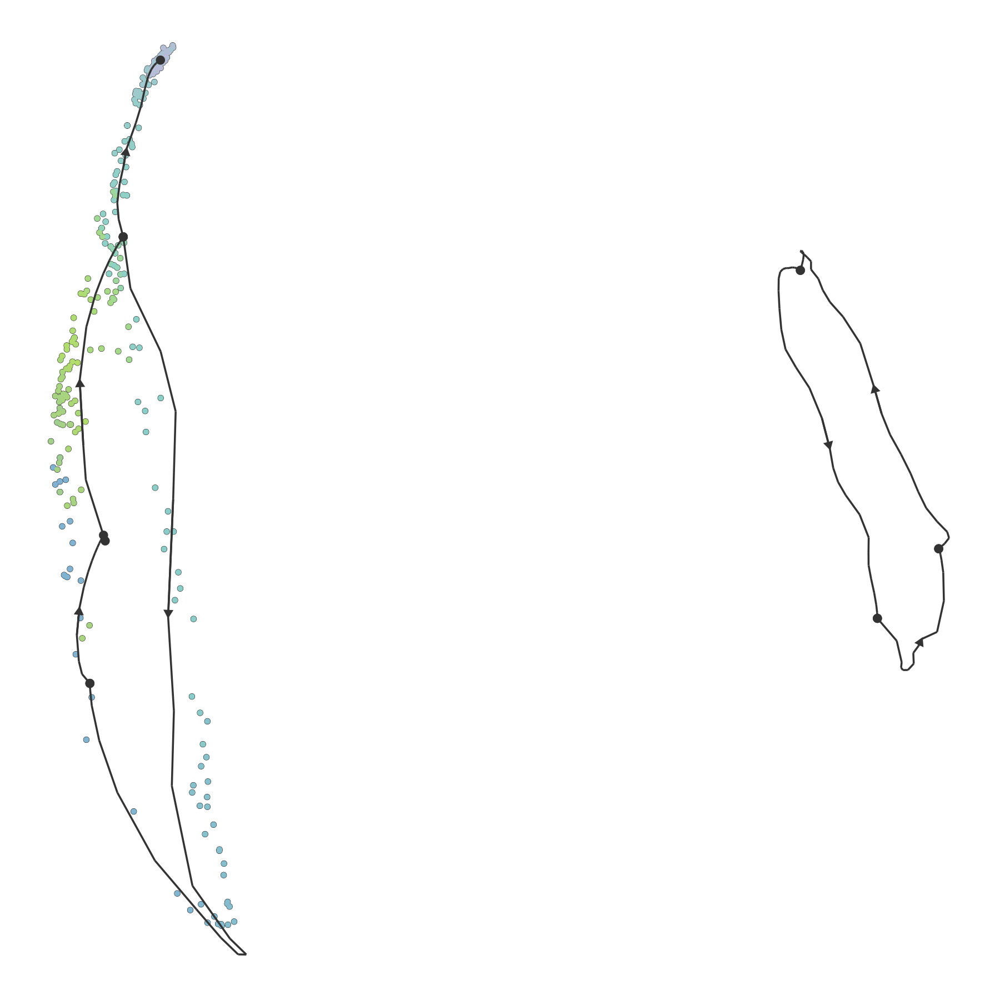

In [24]:
plot_dimred(dataset)